In [1]:
from matplotlib.markers import MarkerStyle
from scipy.spatial.distance import cdist, euclidean,cosine
from skimage import io
from sklearn import cluster
from skimage import color
import skimage.transform

import numpy as np
import matplotlib.pyplot as plt

import time


In [2]:
def plot_img(img):
    plt.axis('off')
    plt.imshow(img, interpolation='none')
    plt.show()

In [3]:
def reduce_colors_bad(img, threshold):
    colors = list()
    new_img = np.copy(img)
    # Iterate through all the pixels
    for y, row in enumerate(new_img):
        for x, pixel in enumerate(row):
            dist = float("inf")
            index = 0
            # Iterate over the colours calculating the minimal distance
            for pos, color in enumerate(colors):
                new_dist = np.linalg.norm(color-pixel)
                if new_dist < dist:
                    dist = new_dist
                    index = pos
            # If the colour difference is smaller than the threshold
            # swap the colour for the closest one
            if dist < threshold:
                new_img[y][x] = colors[index]
            # Otherwise, add the colour to the list of colours
            else:
                colors.append(pixel)

    return new_img



def swap_colours(img, palette):
    new_img = np.copy(img)
    palette = palette.reshape(-1,4)
	# Iterate through all the pixels
    for y, row in enumerate(new_img):
        for x, pixel in enumerate(row):
            dist = float("inf")
            index = 0
            for pos, color in enumerate(palette):
                new_dist = np.linalg.norm(color-pixel)
                if new_dist < dist:
                    dist = new_dist
                    index = pos

            if(pixel[3] != 0):
                new_img[y][x] = palette[index]

    return new_img

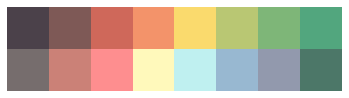

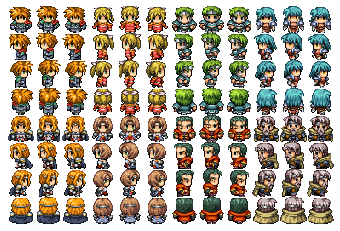

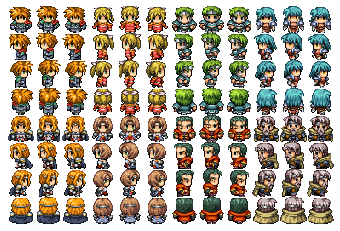

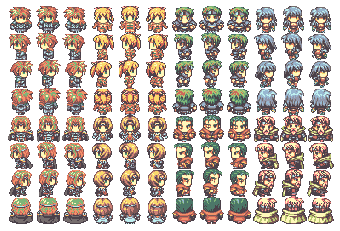

56.155972957611084

In [4]:
start = time.time()

# DECIRLE A GIMP QUE GUARDE ALPHA
palette = io.imread("./palette.png")
plot_img(palette)

img = io.imread("./test1.png")
plot_img(img)

img_reduced = reduce_colors_bad(img, 10)
plot_img(img_reduced)

img_swap = swap_colours(img_reduced, palette)
plot_img(img_swap)

time.time() -start

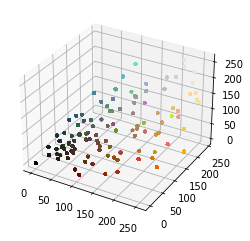

In [9]:
colors_rg = img.reshape((-1,4)).transpose()

fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.scatter(colors_rg[0], colors_rg[1], colors_rg[2], c=img.reshape((-1,4))/255, marker='.')
plt.savefig('sample.svg')

In [14]:
def reduce_colors_good(img):
    data = img.reshape((-1,4)) # convert the image to a list of colours
    data = data[data[:,3] != 0][:,:3] # delete all clear pixels. Important for clustering.
    bw = cluster.estimate_bandwidth(data, quantile=0.05, n_samples=len(data))
    ms = cluster.MeanShift(bandwidth=bw, bin_seeding=True).fit(data)
    palette = ms.cluster_centers_.astype(np.uint8)
    labels = ms.labels_
    return {"palette": palette,"labels": labels}

def palete_dict(old_palette, new_palette):
    ilu = "D65"
    obs = "2"
    new_palette_lab = np.empty((0,3))
    for colour in new_palette:
        new_palette_lab = np.concatenate([new_palette_lab, color.rgb2lab(colour, illuminant=ilu, observer=obs).reshape(1,3)],axis=0)
    
    func = {} # old_colour -> new_colour
    for old_colour in old_palette:
        old_colour_lab = color.rgb2lab(old_colour, illuminant=ilu, observer=obs)
        lowest = [100,[0,0,0]]
        for new_colour in new_palette_lab:
            #deltaE = color.deltaE_ciede94(old_colour_lab,new_colour)
            deltaE = color.deltaE_ciede2000(new_colour,old_colour_lab)
            if deltaE < lowest[0]:
                lowest = [deltaE, new_colour]
        #TODO No se por que en los otros casos no hace falta el casting a Uint
        func[tuple(old_colour)] = np.array(color.lab2rgb(lowest[1], illuminant=ilu, observer=obs)*255, dtype=np.uint8)
        #print(old_colour_lab, lowest[1],  lowest[0])
    return func

def palete_dict_alt(old_palette, new_palette):
    func = {} # old_colour -> new_colour
    for old_colour in old_palette:
        lowest = [1000,[0,0,0]]
        #print("------")
        for new_colour in new_palette:
            #dist = np.linalg.norm(new_colour-old_colour)
            dist = euclidean(new_colour,old_colour)
            #print(old_colour,new_colour, dist, lowest[0], dist < lowest[0])

            if dist < lowest[0]:
                lowest = [dist, new_colour]
        
        func[tuple(old_colour)] = tuple(lowest[1])
    return func


def swap_colours_good(img, labels, func):
    data = img.reshape((-1,4)) # convert the image to a list of colours
    data = data[data[:,3] != 0][:,:3] # delete all clear pixels. Important for clustering.

    new_colors = list(func.values())
    new_data = np.array([new_colors[label] for label in labels])

    rgba = np.ones((new_data.shape[0],new_data.shape[1]+1))*255
    rgba[:,:-1] = new_data
    index_not_transparent = np.where(img[:,:,3] != 0)
    img_out = np.zeros_like(img)
    img_out[index_not_transparent[0][:],index_not_transparent[1][:]] = rgba[:]
    print(rgba)

    return img_out


Old image:


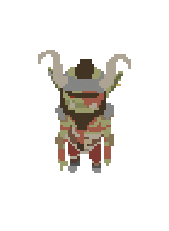

New palette: 


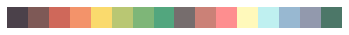

Reduced colours: 


Function old to new: 


New image:
[[146. 152. 172. 255.]
 [146. 152. 172. 255.]
 [146. 152. 172. 255.]
 ...
 [118. 108. 109. 255.]
 [118. 108. 109. 255.]
 [118. 108. 109. 255.]]


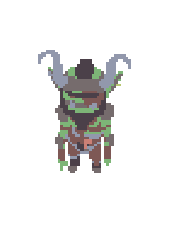

0.45135068893432617

In [16]:
start = time.time()

print("Old image:")
img = io.imread("./test1.png")
plot_img(img)

print("New palette: ")
new_palette = io.imread("./palette.png").reshape(-1,4)[:,:3]
plot_img(new_palette.reshape((1,-1,3)))

print("Reduced colours: ")
reduced = reduce_colors_good(img)
plot_img(reduced["palette"].reshape((1,-1,3)))

print("Function old to new: ")
func = palete_dict(reduced["palette"], new_palette)
plot_img(np.array(list(func.keys())).reshape((1,-1,3)))
plot_img(np.array(list(func.values())).reshape((1,-1,3)))

print("New image:")
plot_img(swap_colours_good(img, reduced["labels"], func))

time.time() - start